## User Engagement analysis

In [1]:
import sys
sys.path.insert(0,'../scripts')

In [2]:
# Setting Notebook preference options, and
# Importing External Modules
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.cluster import KMeans
pd.set_option('max_column', None)
pd.set_option('display.float_format', '{:.2f}'.format)
%matplotlib inline

In [3]:
# Importing Local Modules
from data_loader import load_df_from_csv
from data_information import DataInfo
from data_cleaner import DataCleaner
from data_manipulation import DataManipulator
import graph_utils

We are gonna track the user’s engagement using the following engagement metrics: 
- sessions frequency (by xDr session identifier which is bearer id)
- the duration of the session (by Total Duration of the xDR (in ms) which is Total Duration in our clean data)
- the sessions total traffic (download and upload (bytes)) (by the sum of Total DL (Bytes) and Total UL (Bytes) which in Total Data (MegaBytes) in our clean data)


In [4]:
#Fetching and selecting the specified metric columns only
clean_data = load_df_from_csv("../data/teleCo_clean_data.csv")
cleaner = DataCleaner(clean_data)
cleaner.remove_unwanted_columns(cleaner.df.columns[0])
clean_df = cleaner.df
# df = cleaner.change_columns_type_to(['IMSI','Handset Manufacturer','Handset Type','IMEI','MSISDN/Number','Bearer Id'],'category')
# df = cleaner.df.loc[:,['Bearer Id','Total Duration (hr)','Total Data (MegaBytes)']]

In [5]:
df = clean_df.copy(deep=True)
aggs_by_col = {'Bearer Id':'count', 
               'Total Duration (hr)':'sum',
               'Total Data (MegaBytes)':'sum'
               }

df = df.groupby('MSISDN/Number').agg(aggs_by_col)
df

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
MSISDN/Number,,,
33601001472.00,2,82.76,1035.55
33601003520.00,1,37.49,595.97
33601007616.00,3,24.16,1879.73
33601009664.00,2,70.55,615.22
33601011712.00,3,59.66,987.38
...,...,...,...
33789980672.00,2,58.44,1094.69
33789997056.00,2,41.61,1194.95
3197020930048.00,1,243.72,232.12


### Top 10 users based on Each Metric

#### Based on Frequency on Sessions (Bearer Id count)

In [6]:
dataManipulator = DataManipulator(df)
dataManipulator.get_top_sorted_by_column('Bearer Id',length=10)

,Bearer Id
MSISDN/Number,
33663707136.00,1082
33761613824.00,66
33658490880.00,42
33761214464.00,39
33659359232.00,38
33761611776.00,37
33661859840.00,36
33763592192.00,35
33658066944.00,34


#### Based on Duration of Session (Total Duration (hr))

In [7]:
dataManipulator.get_top_sorted_by_column('Total Duration (hr)',length=10)

,Total Duration (hr)
MSISDN/Number,
33663707136.00,20619.71
33625780224.00,5177.82
33614893056.00,2916.68
33760536576.00,2705.37
33667164160.00,2574.03
33626320896.00,2442.20
33664694272.00,2148.35
33662840832.00,2139.25
33667457024.00,1953.50


#### Based on sessions total traffic (Total Data (MegaBytes))

In [8]:
dataManipulator.get_top_sorted_by_column('Total Data (MegaBytes)',length=10)

,Total Data (MegaBytes)
MSISDN/Number,
33663707136.00,539359.12
33761613824.00,35921.71
33658490880.00,20849.12
33659359232.00,19890.17
33761214464.00,19655.88
33658066944.00,19553.61
33763745792.00,18489.07
33698805760.00,17485.14
33650970624.00,16954.80


### Normalizing each engagement metric

#### Normalizing Bearer Id

In [9]:
# graph_utils.plot_hist(df, column='Bearer Id', color='red')

In [10]:
# graph_utils.plot_hist(df, column='Total Duration (hr)', color='red')

In [11]:
# graph_utils.plot_hist(df, column='Total Data (MegaBytes)', color='red')

In [12]:
# imp_df = df.copy(deep=True)
# dataManipulator = DataManipulator(imp_df)

In [13]:
# scaled_df = dataManipulator.scale_column('Bearer Id')
# scaled_df = dataManipulator.scale_column('Total Duration (hr)')
# scaled_df = dataManipulator.scale_column('Total Data (MegaBytes)')
# scaled_df

In [14]:
# graph_utils.plot_hist(scaled_df, column='Bearer Id', color='yellow')

In [15]:
# dataManipulator = DataManipulator(scaled_df)
# normalized_df = dataManipulator.normalize_column('Bearer Id')
# normalized_df = dataManipulator.normalize_column('Total Duration (hr)')
# normalized_df = dataManipulator.normalize_column('Total Data (MegaBytes)')
# normalized_df

In [16]:
# graph_utils.plot_hist(normalized_df, column='Bearer Id', color='green')

In [17]:
# graph_utils.plot_hist(normalized_df, column='Total Duration (hr)', color='green')

In [18]:
# graph_utils.plot_hist(normalized_df, column='Total Data (MegaBytes)', color='green')

### Standardizing the Data

In [19]:
standard_df = df.copy(deep=True)
dataManipulator = DataManipulator(standard_df)

In [20]:
std_df = dataManipulator.standardize_column('Bearer Id')
std_df = dataManipulator.standardize_column('Total Duration (hr)')
std_df = dataManipulator.standardize_column('Total Data (MegaBytes)')
std_df

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
MSISDN/Number,,,
33601001472.00,-0.31,-0.22,-0.29
33601003520.00,-0.44,-0.45,-0.41
33601007616.00,-0.17,-0.52,-0.06
33601009664.00,-0.31,-0.28,-0.40
33601011712.00,-0.17,-0.34,-0.30
...,...,...,...
33789980672.00,-0.31,-0.34,-0.28
33789997056.00,-0.31,-0.43,-0.25
3197020930048.00,-0.44,0.62,-0.51


In [21]:
# graph_utils.plot_hist(std_df, column='Bearer Id', color='green')

### Clustering to 3 Groups

In [22]:
standardized_df = std_df.copy(deep=True)
# clust_df = clust_df.iloc[:,1:]

# Centroids of the clustering:
[[ 1.91578286  2.45527997  1.92454087]
 [ 0.67061156  0.76078327  0.66547133]
 [-0.28877298 -0.34769947 -0.28823084]]
# The number of iterations required to converge: 62650.83990253995
# The number of iterations required to converge: 28
C:\Python38\lib\site-packages\matplotlib\collections.py:1003: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


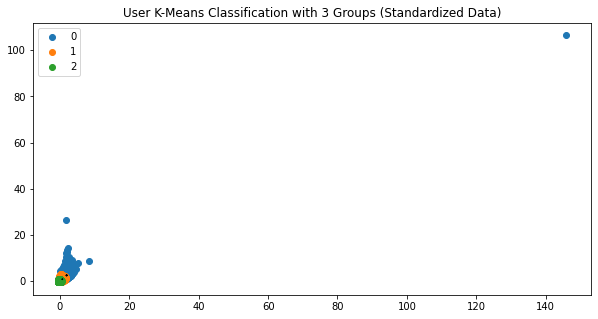

In [23]:
kmeans = KMeans(init="random",n_clusters=3,n_init=10,max_iter=300,random_state=42)
label = kmeans.fit_predict(standardized_df)
centroids = kmeans.cluster_centers_
print(f'# Centroids of the clustering:\n{centroids}')
print(f'# The number of iterations required to converge: {kmeans.inertia_}')
print(f'# The number of iterations required to converge: {kmeans.n_iter_}')
#Getting index based on clusters
u_labels = np.unique(label)
 
#plotting the results:
plt.figure(figsize=(10,5))
plt.title('User K-Means Classification with 3 Groups (Standardized Data)')
for i in u_labels:
    plt.scatter(standardized_df[label == i].iloc[:,0] , standardized_df[label == i].iloc[:,1], marker='o', label = i)
plt.scatter(centroids[:,0] , centroids[:,1],centroids[:,2], marker='x', color = 'black')
plt.legend()
plt.show()

### Computing the minimum, maximum, average & total non-normalized metrics for each cluster

In [24]:
cluster_map_standardized = pd.DataFrame()
cluster_map_standardized['data_index'] = standardized_df.index.values
cluster_map_standardized['cluster'] = kmeans.labels_

In [25]:
standardized_cluster_1 = cluster_map_standardized[cluster_map_standardized.cluster == 0].iloc[:,0].values.tolist()
cluster_1_df = standardized_df.loc[standardized_cluster_1,:]

In [26]:
standardized_cluster_2 = cluster_map_standardized[cluster_map_standardized.cluster == 1].iloc[:,0].values.tolist()
cluster_2_df = standardized_df.loc[standardized_cluster_2,:]

In [27]:
standardized_cluster_3 = cluster_map_standardized[cluster_map_standardized.cluster == 2].iloc[:,0].values.tolist()
cluster_3_df = standardized_df.loc[standardized_cluster_3,:]

In [28]:
cluster_1_df

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
MSISDN/Number,,,
33603127296.00,1.59,8.82,1.34
33604515840.00,1.05,6.87,0.91
33606572032.00,0.64,2.63,0.63
33608163328.00,1.18,1.97,0.98
33608521728.00,0.91,3.25,0.56
...,...,...,...
33763938304.00,0.91,2.90,0.89
33764489216.00,1.05,4.89,0.86
33777774592.00,0.50,2.92,0.39


In [29]:
#Separate the indexes and using them select rows from the starting main dataframe containing the initial metrics grouped by the MSISDN Number
cluster_1_index = cluster_1_df.index.values.tolist()
cluster_2_index = cluster_2_df.index.values.tolist()
cluster_3_index = cluster_3_df.index.values.tolist()
cluster_1_index[:5]

[33603127296.0, 33604515840.0, 33606572032.0, 33608163328.0, 33608521728.0]

In [30]:
#selecting the values using the indexes

In [31]:
cluster_1_adf = df.loc[cluster_1_index,:]
cluster_2_adf = df.loc[cluster_2_index,:]
cluster_3_adf = df.loc[cluster_3_index,:]
cluster_1_adf.head()

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
MSISDN/Number,,,
33603127296.00,16,1823.21,7105.86
33604515840.00,12,1446.67,5487.86
33606572032.00,9,631.12,4452.39
33608163328.00,13,502.60,5753.52
33608521728.00,11,749.69,4188.53


In [32]:
# calculating the minimum, maximum, average & total values for each column
cluster_1_explorer = DataInfo(cluster_1_adf)
cluster_1_explorer.get_column_dispersion_with_total_params()

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
count,1915.00,1915.00,1915.00
mean,18.46,598.14,9278.00
std,24.68,521.50,12329.96
min,5.00,299.55,2226.34
25%,15.00,454.07,7543.51
50%,17.00,526.38,8703.44
75%,20.00,651.63,10079.27
max,1082.00,20619.71,539359.12
Mode,16.00,299.55,2226.34
Median,17.00,526.38,8703.44


In [33]:
cluster_2_explorer = DataInfo(cluster_2_adf)
cluster_2_explorer.get_column_dispersion_with_total_params()

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
count,6137.00,6137.00,6137.00
mean,9.25,271.08,4599.13
std,2.75,86.41,1434.61
min,2.00,74.14,898.37
25%,7.00,205.74,3499.36
50%,9.00,259.73,4415.36
75%,11.00,328.93,5627.20
max,17.00,714.22,9232.09
Mode,7.00,220.77,3993.43
Median,9.00,259.73,4415.36


In [34]:
cluster_2_explorer.df

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
MSISDN/Number,,,
33601054720.00,7,213.11,3111.96
33601073152.00,7,139.93,3451.97
33601269760.00,10,218.52,3338.55
33601492992.00,9,382.10,4352.79
33601771520.00,7,113.52,4132.11
...,...,...,...
33788379136.00,3,329.11,951.11
33788590080.00,5,408.01,1884.61
33788661760.00,6,187.75,2382.17


In [35]:
cluster_3_explorer = DataInfo(cluster_3_adf)
cluster_3_explorer.get_column_dispersion_with_total_params()

,Bearer Id,Total Duration (hr),Total Data (MegaBytes)
count,27038.00,27038.00,27038.00
mean,2.14,57.31,1049.35
std,1.29,43.33,707.42
min,1.00,2.04,37.93
25%,1.00,24.11,522.33
50%,2.00,45.96,861.38
75%,3.00,80.04,1457.84
max,8.00,328.32,4287.29
Mode,1.00,24.00,158.02
Median,2.00,45.96,861.38


In [36]:
unstandardized_df = df.copy(deep=True)

# Centroids of the clustering:
	[[2.09226303e+00 5.84124496e+01 1.00032093e+03]
 [8.61872219e+00 2.54097855e+02 4.30971574e+03]
 [1.76977153e+01 5.31948173e+02 9.10257131e+03]]
# The number of iterations required to converge: 310283730000.24884
# The number of iterations required to converge: 18


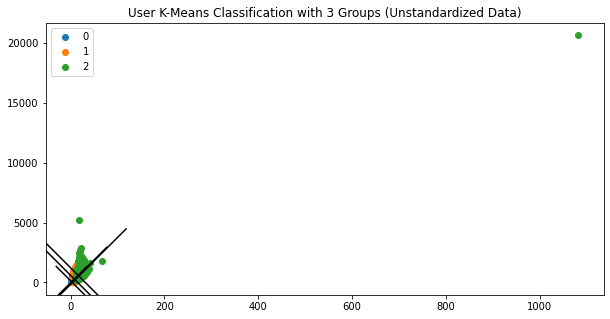

In [37]:
km = KMeans(init="random",n_clusters=3,n_init=10,max_iter=300,random_state=42)
label = km.fit_predict(unstandardized_df)
centroids = km.cluster_centers_
print(f'# Centroids of the clustering:\n\t{centroids}')
print(f'# The number of iterations required to converge: {km.inertia_}')
print(f'# The number of iterations required to converge: {km.n_iter_}')
#Getting index based on clusters
u_labels = np.unique(label)
 
#plotting the results:
plt.figure(figsize=(10,5))
plt.title('User K-Means Classification with 3 Groups (Unstandardized Data)')
for i in u_labels:
    plt.scatter(unstandardized_df[label == i].iloc[:,0] , unstandardized_df[label == i].iloc[:,1], marker='o', label = i)
plt.scatter(centroids[:,0] , centroids[:,1],centroids[:,2], marker='x', color = 'black')
plt.legend()
plt.show()


### 10 Most Engaged Users Per Application

In [38]:
engage_df = clean_df.copy(deep=True)

In [39]:
aggs_by_col = {'Total Social Media Data (MegaBytes)':'sum',
'Total Google Data (MegaBytes)':'sum',
'Total Email Data (MegaBytes)':'sum',
'Total Youtube Data (MegaBytes)':'sum',
'Total Netflix Data (MegaBytes)':'sum',
'Total Gaming Data (MegaBytes)':'sum',
'Total Other Data (MegaBytes)':'sum',}

engage_df = engage_df.groupby('MSISDN/Number').agg(aggs_by_col)
engage_df

,Total Social Media Data (MegaBytes),Total Google Data (MegaBytes),Total Email Data (MegaBytes),Total Youtube Data (MegaBytes),Total Netflix Data (MegaBytes),Total Gaming Data (MegaBytes),Total Other Data (MegaBytes)
MSISDN/Number,,,,,,,
33601001472.00,4.89,9.72,4.64,34.06,38.40,932.21,668.28
33601003520.00,3.20,3.44,3.21,21.33,19.35,538.83,501.69
33601007616.00,3.19,28.18,5.59,48.51,51.14,1705.92,840.08
33601009664.00,3.79,15.26,7.85,34.35,30.32,511.64,492.37
33601011712.00,4.55,22.22,3.57,45.32,61.11,830.83,403.09
...,...,...,...,...,...,...,...
33789980672.00,4.25,10.25,5.32,38.01,51.95,972.34,1075.14
33789997056.00,0.80,12.96,3.52,46.50,23.43,1097.36,506.40
3197020930048.00,0.72,10.44,1.52,11.96,26.59,178.05,470.53


#### Top 10 Users Engaged in Social Media Activities

In [40]:
dataManipulator = DataManipulator(engage_df)
dataManipulator.get_top_sorted_by_column('Total Social Media Data (MegaBytes)',length=10)

,Total Social Media Data (MegaBytes)
MSISDN/Number,
33663707136.00,2007.45
33761613824.00,135.01
33658490880.00,82.56
33659359232.00,71.18
33761214464.00,69.07
33699373056.00,67.06
33763592192.00,66.87
33659744256.00,65.04
33658970112.00,64.87


#### Top 10 Users Engaged in Google related Activities

In [41]:
dataManipulator.get_top_sorted_by_column('Total Google Data (MegaBytes)',length=10)

,Total Google Data (MegaBytes)
MSISDN/Number,
33663707136.00,8362.26
33761613824.00,502.81
33658490880.00,327.27
33659359232.00,321.21
33661859840.00,309.19
33761214464.00,304.81
33661978624.00,299.51
33763592192.00,297.38
33699373056.00,287.44


#### Top 10 Users Engaged in Email related Activities

In [42]:
dataManipulator.get_top_sorted_by_column('Total Email Data (MegaBytes)',length=10)

,Total Email Data (MegaBytes)
MSISDN/Number,
33663707136.00,2437.86
33761613824.00,132.27
33658490880.00,97.28
33761214464.00,90.70
33763592192.00,85.60
33761611776.00,82.62
33659359232.00,80.73
33699373056.00,80.44
33762172928.00,77.37


#### Top 10 Users Engaged in Youtube Activity

In [43]:
dataManipulator.get_top_sorted_by_column('Total Youtube Data (MegaBytes)',length=10)

,Total Youtube Data (MegaBytes)
MSISDN/Number,
33663707136.00,24713.97
33761613824.00,1469.31
33658490880.00,930.59
33659359232.00,894.55
33661859840.00,894.37
33763592192.00,848.22
33761214464.00,810.87
33761611776.00,797.84
33699373056.00,790.61


#### Top 10 Users Engaged in Netflix Activity

In [44]:
dataManipulator.get_top_sorted_by_column('Total Netflix Data (MegaBytes)',length=10)

,Total Netflix Data (MegaBytes)
MSISDN/Number,
33663707136.00,24631.02
33761613824.00,1466.31
33658490880.00,1016.66
33761214464.00,965.79
33761611776.00,896.03
33659359232.00,825.94
33763592192.00,788.86
33658066944.00,770.54
33658806272.00,769.58


#### Top 10 Users Engaged in Gaming related Activities

In [45]:
dataManipulator.get_top_sorted_by_column('Total Gaming Data (MegaBytes)',length=10)

,Total Gaming Data (MegaBytes)
MSISDN/Number,
33663707136.00,468035.00
33761613824.00,31686.84
33658490880.00,18006.14
33659359232.00,17439.51
33658066944.00,17377.50
33761214464.00,17087.29
33763745792.00,16462.65
33698805760.00,15350.95
33650970624.00,15141.36


#### Top 10 Users Engaged in Other Activities

In [46]:
dataManipulator.get_top_sorted_by_column('Total Other Data (MegaBytes)',length=10)

,Total Other Data (MegaBytes)
MSISDN/Number,
33663707136.00,458101.25
33761613824.00,28293.60
33761214464.00,19020.86
33658490880.00,18238.22
33659359232.00,16597.00
33661859840.00,16430.12
33761560576.00,15776.85
33661978624.00,15324.67
33761165312.00,15104.71


### Top 3 Most Used Applications 

In [47]:
most_used_df = clean_df.copy(deep=True)
most_used_df = most_used_df.loc[:,['Total Google Data (MegaBytes)','Total Email Data (MegaBytes)','Total Youtube Data (MegaBytes)','Total Netflix Data (MegaBytes)','Total Gaming Data (MegaBytes)','Total Other Data (MegaBytes)']]

In [48]:
total_app_data_usage = pd.DataFrame(most_used_df.sum(), columns=['Total Data (MegaBytes)'])
total_app_data_usage.sort_values(by='Total Data (MegaBytes)',ascending=False).iloc[:4,:]

,Total Data (MegaBytes)
Total Gaming Data (MegaBytes),64549960.00
Total Other Data (MegaBytes),64404792.00
Total Youtube Data (MegaBytes),3396522.25
Total Netflix Data (MegaBytes),3394291.00


The Top 3 Most Used Applications are Gaming, Youtube, Netflix in order respectively (considering Other is not really an application)

### k-means optimized (elbow method) clustering of users based on metrics

#### Finding the optimimum k-value

In [49]:
kmeans_kwargs = {"init": "random","n_init": 10,"max_iter": 300,"random_state": 42}
# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(standardized_df)
    sse.append(kmeans.inertia_)

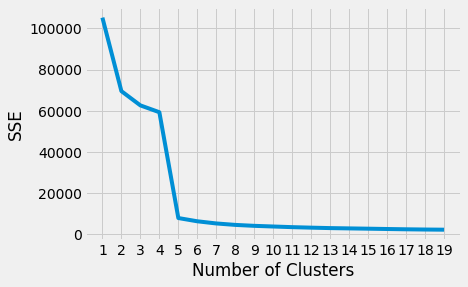

In [50]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [51]:
kl = KneeLocator(range(1, 20), sse, curve="convex", direction="decreasing")
kl.elbow

5

# Centroids of the clustering:
[[145.78834894 106.45702362 144.66059875]
 [  1.0345777    1.16341041   1.02821665]
 [ -0.34226248  -0.41329342  -0.34253799]
 [  2.06280702   2.83761224   2.07153098]
 [  0.16778118   0.20230885   0.17107682]]
# The number of iterations required to converge: 7944.917936965136
# The number of iterations required to converge: 49
C:\Python38\lib\site-packages\matplotlib\collections.py:1003: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


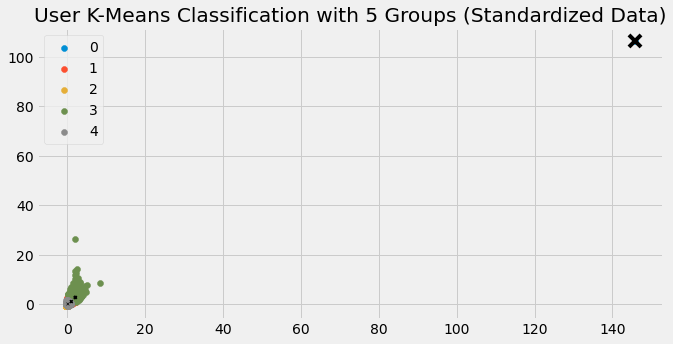

In [55]:
kmeans = KMeans(init="random",n_clusters=kl.elbow,n_init=10,max_iter=300,random_state=42)
label = kmeans.fit_predict(standardized_df)
centroids = kmeans.cluster_centers_
print(f'# Centroids of the clustering:\n{centroids}')
print(f'# The number of iterations required to converge: {kmeans.inertia_}')
print(f'# The number of iterations required to converge: {kmeans.n_iter_}')
#Getting index based on clusters
u_labels = np.unique(label)
 
#plotting the results:
plt.figure(figsize=(10,5))
plt.title(f'User K-Means Classification with {kl.elbow} Groups (Standardized Data)')
for i in u_labels:
    plt.scatter(standardized_df[label == i].iloc[:,0] , standardized_df[label == i].iloc[:,1], marker='o', label = i)
plt.scatter(centroids[:,0] , centroids[:,1],centroids[:,2], marker='x', color = 'black')
plt.legend()
plt.show()

In [63]:
standardized_df['cluster'] = label
cleaner = DataCleaner(standardized_df)
cleaner.save_clean_data('../data/engagement_cluster.csv')

In [61]:
centroids_df = pd.DataFrame(centroids, columns=['Bearer Id','Total Duration (hr)','Total Data (MegaBytes)'])
cleaner = DataCleaner(centroids_df)
cleaner.save_clean_data('../data/engagement_centroid.csv')